##### imports

# To-Do:
- Reattempt 90-class
- see if previous grad-cam results can be recreated
- cross validated model?
- candidate(s) for deployment

In [ ]:
import tensorflow as tf
import keras
from keras.saving import load_model
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from keras.applications import MobileNetV2
from keras import layers,models
from tensorflow import data as tf_data
import os
import random
import zipfile
import shutil
import pandas as pd
from sklearn.metrics import (roc_curve, roc_auc_score, confusion_matrix,
                             ConfusionMatrixDisplay,classification_report)
import reload_data2
#from google.colab import drive
#drive.mount(' /content/drive')
import random
from PIL import Image
from tqdm import tqdm
from concurrent.futures import ProcessPoolExecutor
import Handwriting_XAI2 as xai

In [ ]:
def process_image(args):
    img_path, output_path, target_size, bw_threshold = args

    with Image.open(img_path) as img:
        img = img.convert("RGB")
        w, h = img.size

        if h > w:
            # Tall image → crop from bottom
            img = img.crop((0, 0, w, w))   # keep top square
            squared_img = img

        else:
            # Wide image → pad normally
            max_dim = max(w, h)

            squared_img = Image.new("RGB", (max_dim, max_dim), (255,255,255))
            squared_img.paste(img, (0,0))

        if target_size:
            squared_img = squared_img.resize(target_size, Image.LANCZOS)

        # Convert to pure black and white (no greyscale) via thresholding
        greyscale = squared_img.convert("L")
        bw_img = greyscale.point(lambda p: 255 if p >= bw_threshold else 0, "1")

        bw_img.save(output_path)


def process_dataset(input_root, output_root, target_size=(384,384), workers=8, bw_threshold=235):

    tasks = []

    for split in ["train", "val", "test"]:
        split_path = os.path.join(input_root, split)

        for class_name in os.listdir(split_path):

            class_path = os.path.join(split_path, class_name)
            if not os.path.isdir(class_path):
                continue

            output_class_path = os.path.join(output_root, split, class_name)
            os.makedirs(output_class_path, exist_ok=True)

            for img_name in os.listdir(class_path):
                if img_name.lower().endswith(('.png','.jpg','.jpeg')):

                    img_path = os.path.join(class_path, img_name)
                    output_path = os.path.join(output_class_path, img_name)

                    tasks.append((img_path, output_path, target_size, bw_threshold))

    with ProcessPoolExecutor(max_workers=workers) as executor:
        list(tqdm(executor.map(process_image, tasks), total=len(tasks)))

In [ ]:
df = pd.read_csv("/content/Handwriting_Metadata_clean.csv")
df=df.sort_values(by="wid").reset_index(drop=True)
df.head(5)

,wid,agegroup,gender,handedness
0,w0001,25-40,female,right
1,w0002,41-60,male,right
2,w0003,25-40,female,right
3,w0004,18-24,female,ambidextrous
4,w0005,18-24,male,right


In [ ]:
IMAGE_SIZE = (442,442)
BATCH_SIZE = 64
INPUT_SHAPE = IMAGE_SIZE + (3,)
NUM_CLASSES = 90

In [ ]:
try:
    shutil.rmtree("/content/Handwriting_Images")
    shutil.rmtree("/content/New_Data")
except:
    pass
! unzip -q /content/Handwriting_Images_90sorted.zip

In [ ]:
shutil.rmtree("__MACOSX")

In [ ]:
data_dir = "/content/Handwriting_Images"

new_data_dir="New_Data"
os.mkdir(new_data_dir)

In [ ]:
%%time
reload_data2.stratify_split_alt(data_dir)
reload_data2.del_old_writer_directories(data_dir)
process_dataset(data_dir, new_data_dir, target_size=IMAGE_SIZE,bw_threshold=235)

Using 90 class labels


100%|██████████| 2430/2430 [00:54<00:00, 44.28it/s]


CPU times: user 1.9 s, sys: 839 ms, total: 2.73 s
Wall time: 56.1 s


In [ ]:
train_ds,val_ds,test_ds=reload_data2.train_val_test_split(new_data_dir,
                                                       IMAGE_SIZE=IMAGE_SIZE,
                                                       BATCH_SIZE=BATCH_SIZE)

Found 1350 files belonging to 90 classes.
Found 540 files belonging to 90 classes.
Found 540 files belonging to 90 classes.


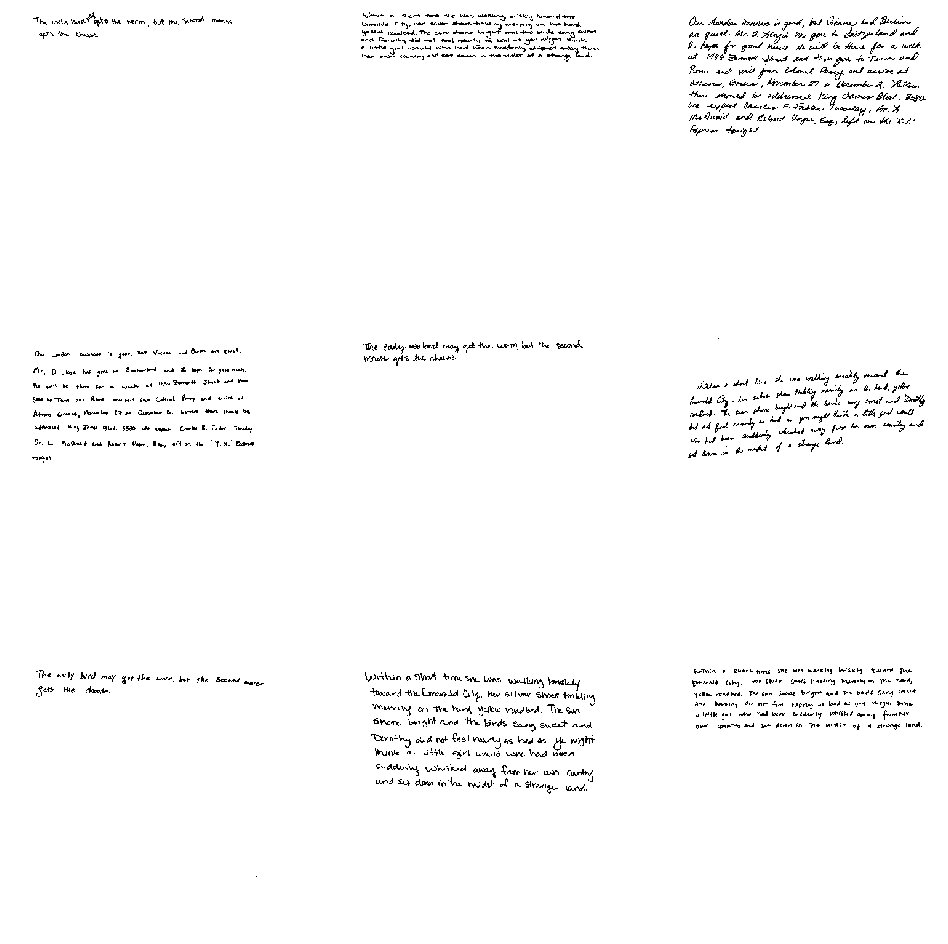

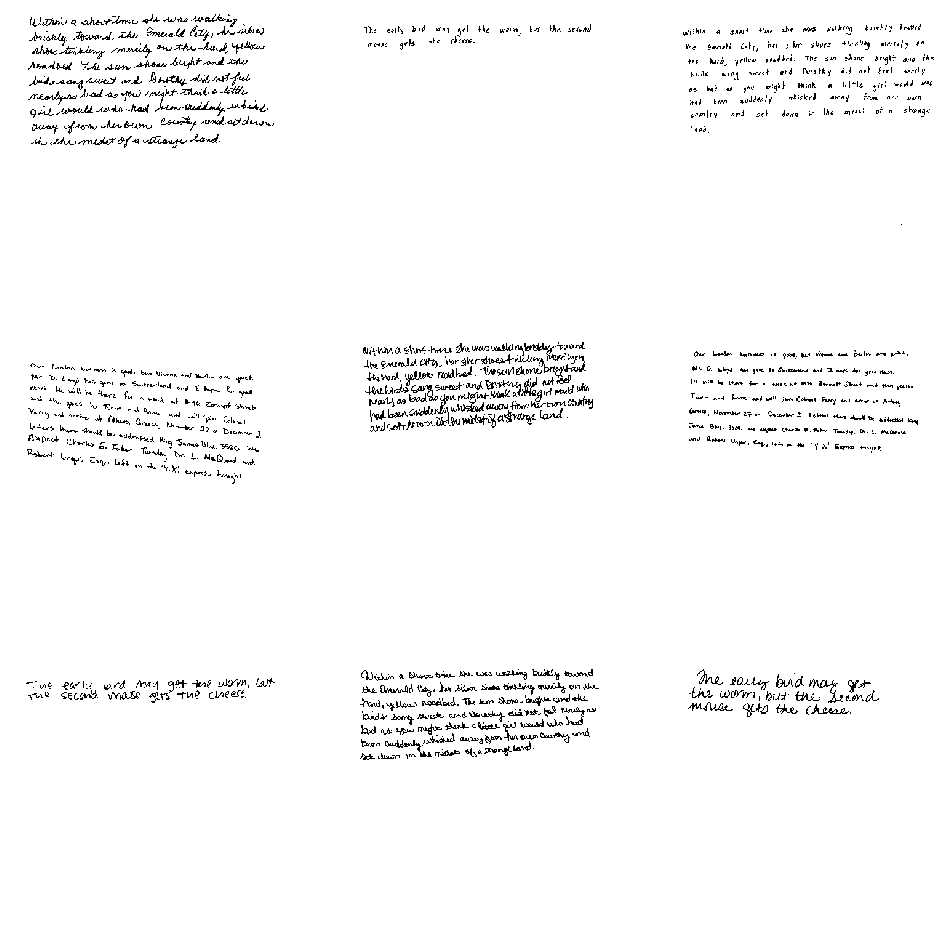

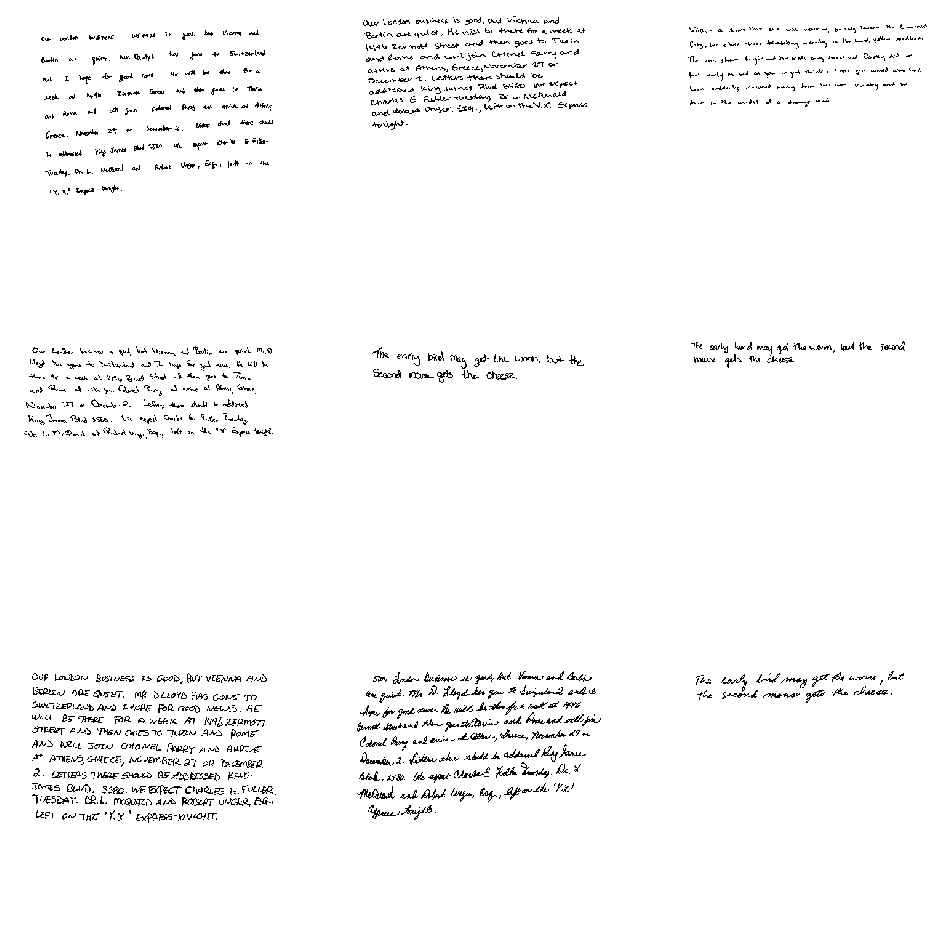

In [ ]:
reload_data2.show_image(train_ds)
print()
reload_data2.show_image(val_ds)
print()
reload_data2.show_image(test_ds)

In [ ]:
! zip -rq Highres3_test.zip /content/New_Data/test

# Modelling

In [ ]:
base_model = keras.applications.MobileNetV2(
                        include_top = False,
                        classifier_activation="softmax",
                        weights = "imagenet",
                        input_shape=(IMAGE_SIZE + (3,))
                        )

model = reload_data2.make_transfer_model(base_model,input_shape=INPUT_SHAPE,
                                         num_classes=NUM_CLASSES,
                                         name="HighRes3")
model.summary()

/tmp/ipykernel_5613/700886392.py:1: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = keras.applications.MobileNetV2(


Model: "HighRes3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 442, 442, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_1 (TrueDivide)      │ (None, 442, 442, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_1 (Subtract)           │ (None, 442, 442, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 14, 14, 1280)   │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 14, 14, 1280)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 90)             │       115,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,373,274 (9.05 MB)

 Trainable params: 115,290 (450.35 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
model.get_layer("mobilenetv2_1.00_224").summary()

Model: "mobilenetv2_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 384, 384,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 192, 192,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 192, 192,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 192, 192,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 192, 192,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 192, 192,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 192, 192,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 192, 192,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 192, 192,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 192, 192,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 192, 192,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 192, 192,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 193, 193,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 96, 96,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 96, 96,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 96, 96,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 96, 96,    │      2,304 │ block_1_depthwis

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

## epochs

In [ ]:
%%time

epochs = 80

model.compile(
    optimizer= "adam",
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True), ###make sure is true
    metrics=[keras.metrics.SparseCategoricalAccuracy(name="acc"),
             keras.metrics.SparseTopKCategoricalAccuracy(k=3, name="top3_acc")],
    )

history = model.fit(
    train_ds,
    epochs= epochs,
    validation_data= val_ds)

model.save("HighRes3.keras")

#save metrics
lossacc = pd.DataFrame(history.history)
lossacc.to_csv(f"HighRes3_lossacc.csv")

Epoch 1/80
22/22 ━━━━━━━━━━━━━━━━━━━━ 30s 911ms/step - acc: 0.0141 - loss: 4.8278 - top3_acc: 0.0415 - val_acc: 0.0704 - val_loss: 4.2934 - val_top3_acc: 0.1315
Epoch 2/80
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - acc: 0.0541 - loss: 4.3548 - top3_acc: 0.1133 - val_acc: 0.1537 - val_loss: 4.0220 - val_top3_acc: 0.2556
Epoch 3/80
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - acc: 0.0852 - loss: 4.0777 - top3_acc: 0.1674 - val_acc: 0.1741 - val_loss: 3.8429 - val_top3_acc: 0.3315
Epoch 4/80
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - acc: 0.1030 - loss: 3.9215 - top3_acc: 0.2126 - val_acc: 0.1852 - val_loss: 3.6923 - val_top3_acc: 0.3741
Epoch 5/80
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - acc: 0.1422 - loss: 3.7192 - top3_acc: 0.2807 - val_acc: 0.2519 - val_loss: 3.5530 - val_top3_acc: 0.4759
Epoch 6/80
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - acc: 0.1667 - loss: 3.5571 - top3_acc: 0.3311 - val_acc: 0.3037 - val_loss: 3.4414 - val_top3_acc: 0.5185
Epoch 7/80
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 59m

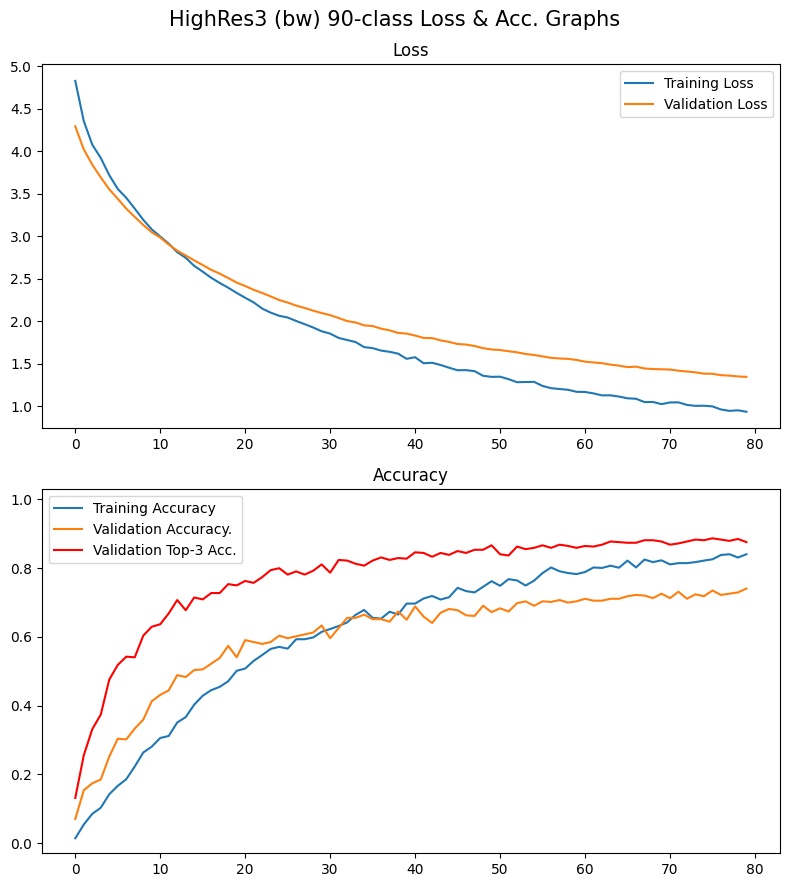

In [ ]:
plt.figure(figsize=(8,9))
plt.suptitle("HighRes3 (bw) 90-class Loss & Acc. Graphs",size=15)

plt.subplot(2,1,1)
plt.plot(range(len(history.history["loss"])),history.history["loss"],label="Training Loss")
plt.plot(range(len(history.history["val_loss"])),history.history["val_loss"],label="Validation Loss")
plt.title("Loss")
plt.legend()

plt.subplot(2,1,2)
plt.plot(range(len(history.history["acc"])),history.history["acc"],label="Training Accuracy")
plt.plot(range(len(history.history["val_acc"])),history.history["val_acc"],label="Validation Accuracy.")
plt.plot(range(len(history.history["val_top3_acc"])),history.history["val_top3_acc"],label="Validation Top-3 Acc.",color="red")
plt.title("Accuracy")
bottom,top=plt.ylim()
plt.ylim(bottom,1-bottom)
plt.legend()

plt.tight_layout()
plt.show()

### Test Set

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - acc: 0.7185 - loss: 1.4036 - top3_acc: 0.8556
{'acc': 0.7185184955596924, 'loss': 1.4036418199539185, 'top3_acc': 0.855555534362793}

2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step


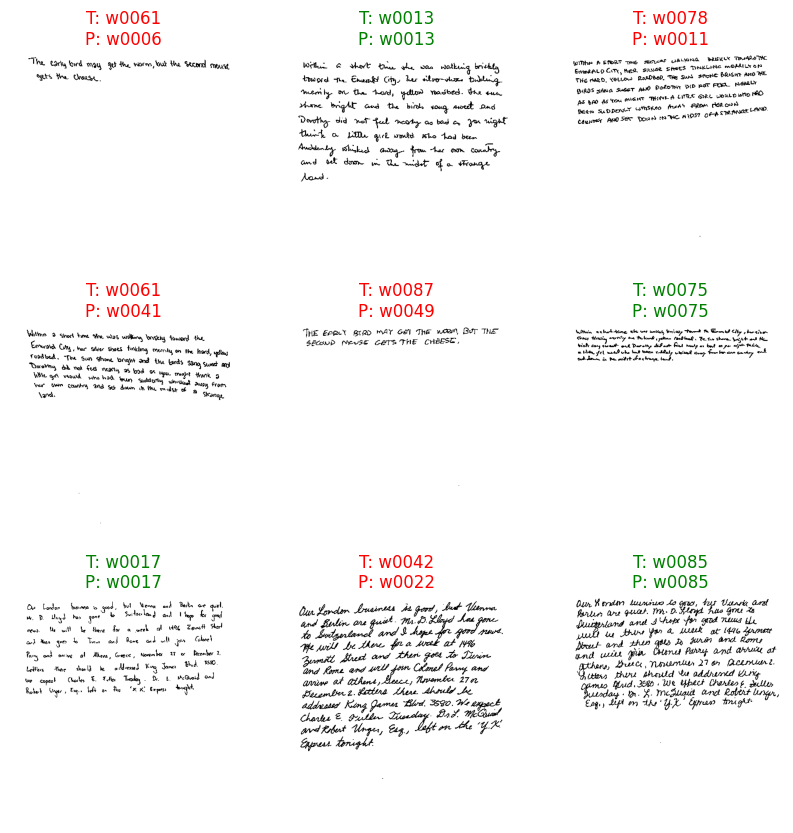

In [ ]:
results = model.evaluate(test_ds, return_dict=True)

print(results)
print()

reload_data2.show_testpreds(test_ds,model)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


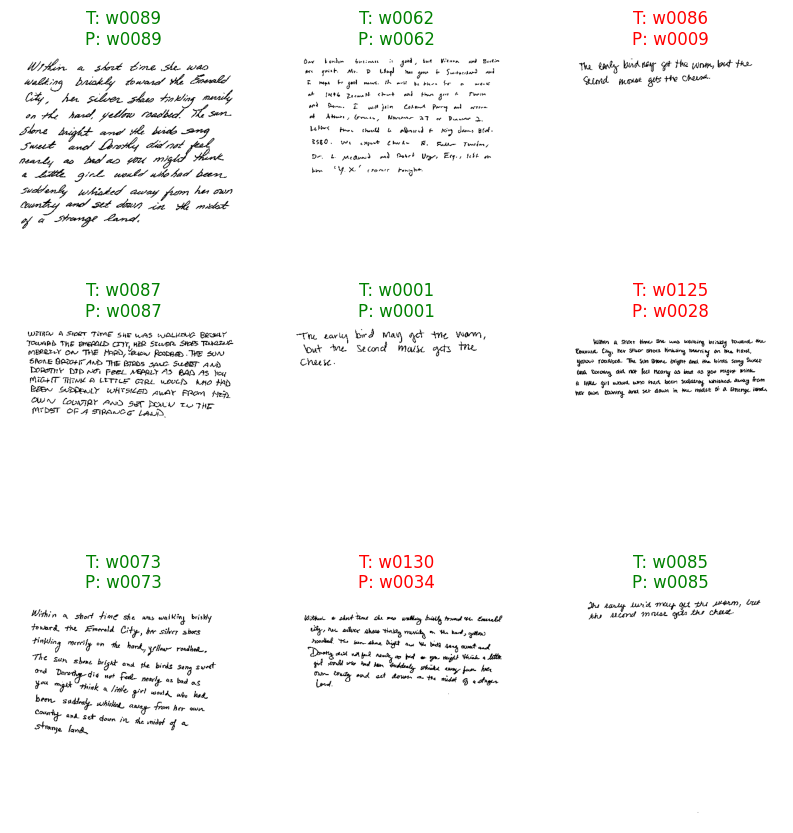

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


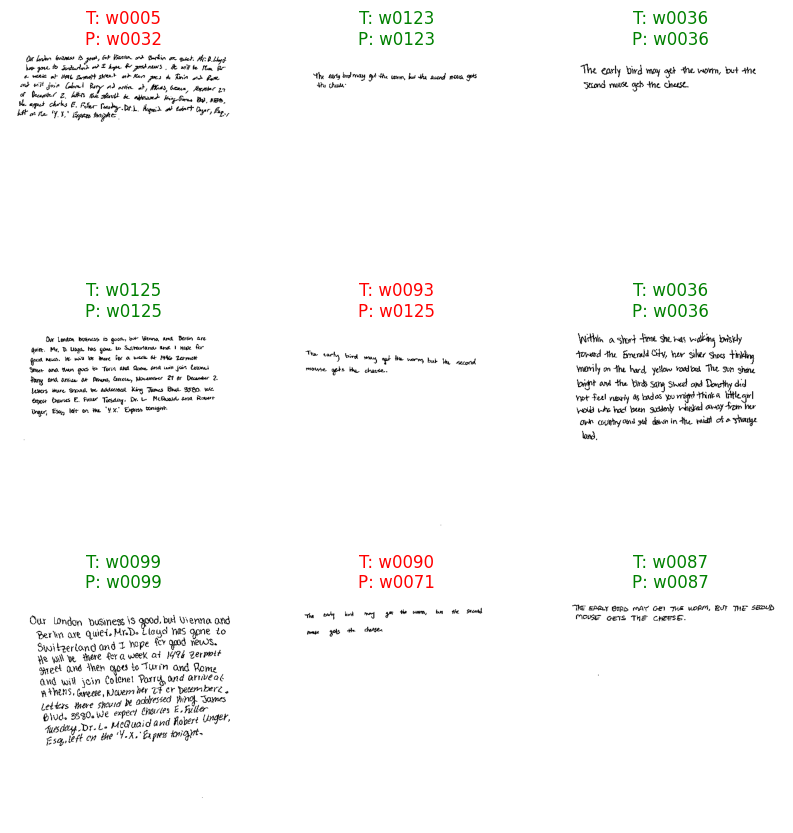

In [ ]:
reload_data2.show_testpreds(test_ds,model)
reload_data2.show_testpreds(test_ds,model)

### XAI

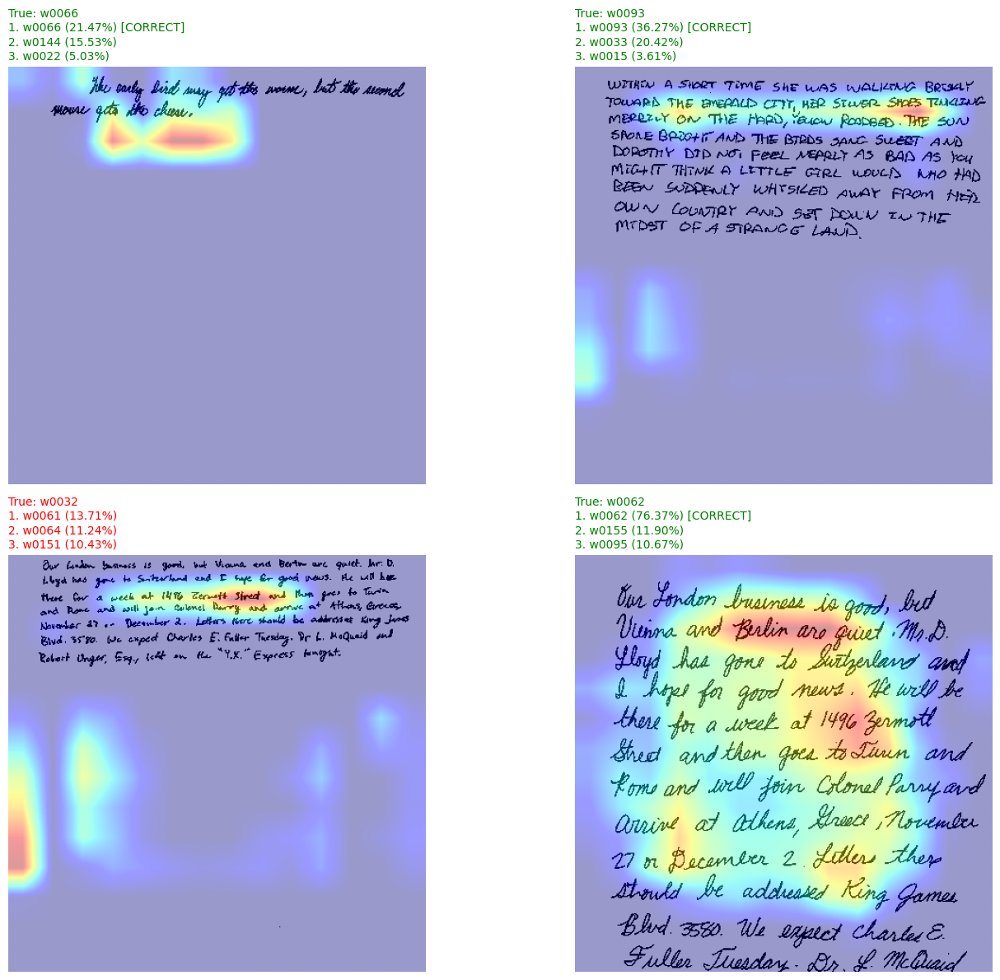

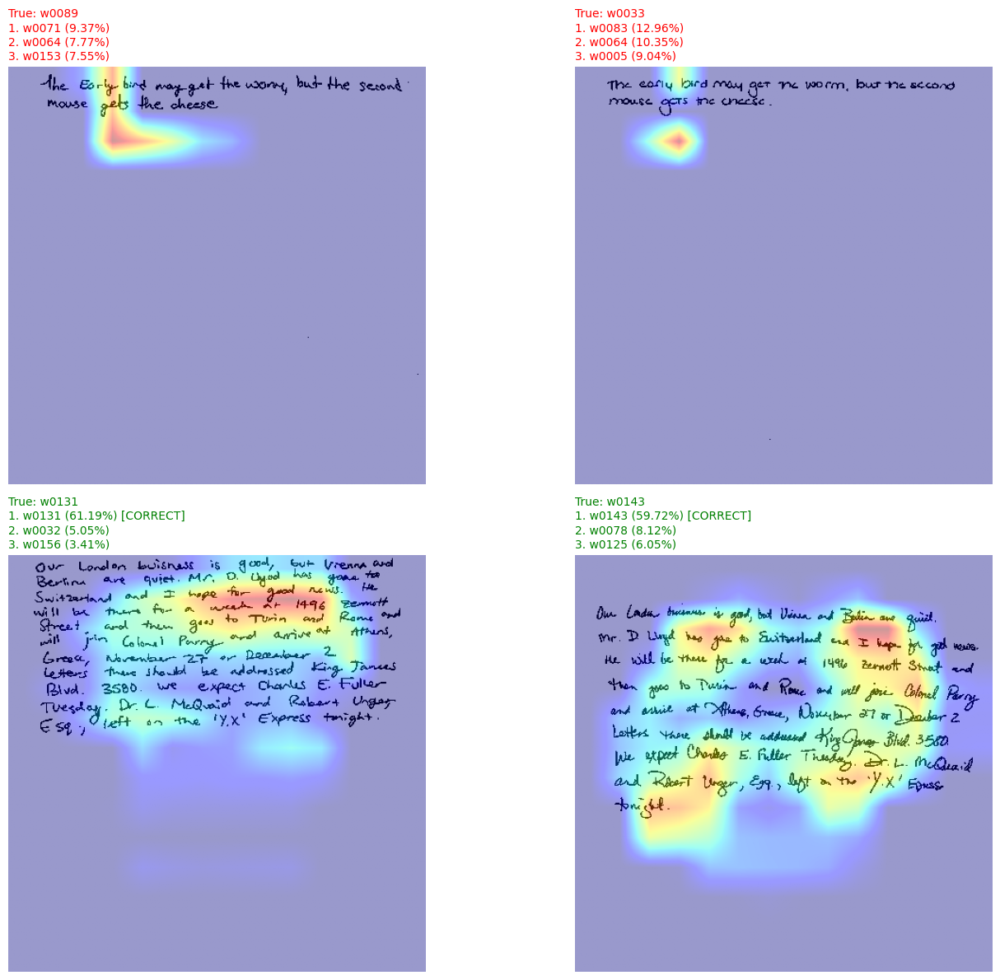

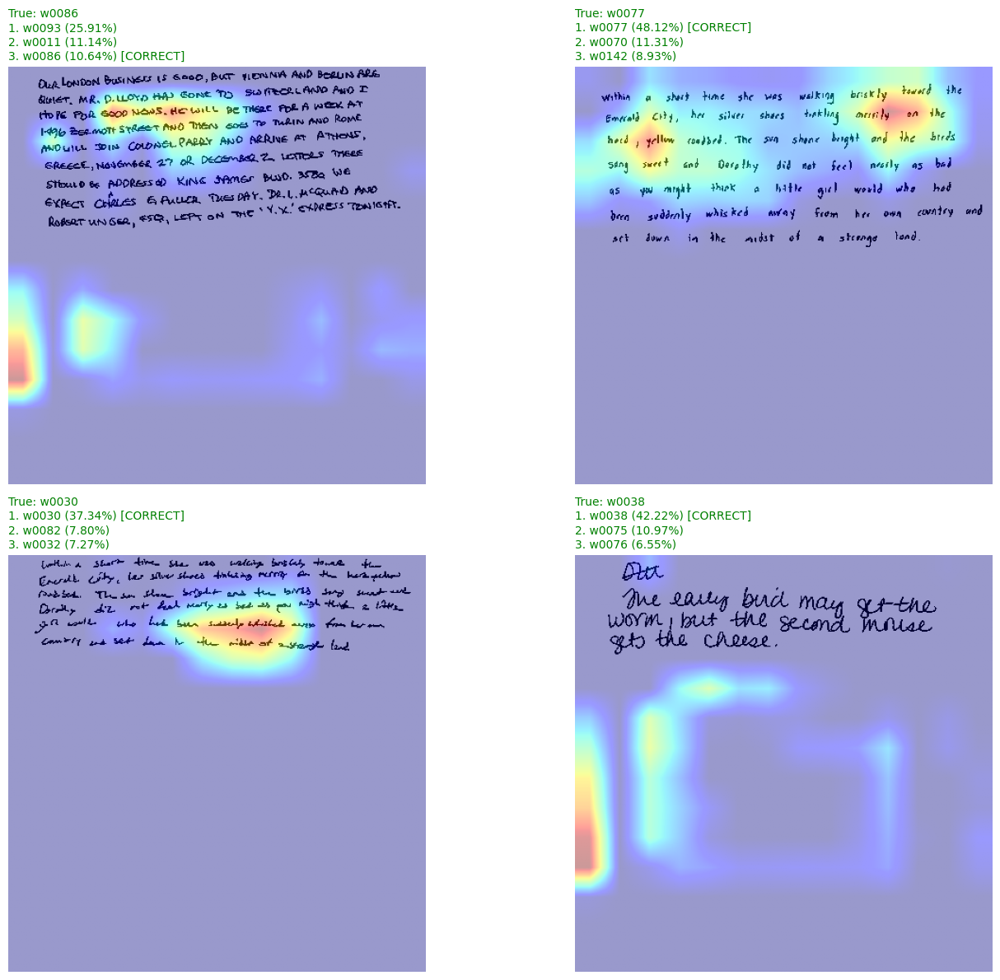

CPU times: user 9.86 s, sys: 366 ms, total: 10.2 s
Wall time: 9.8 s


In [ ]:
%%time
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="out_relu", n=4)
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="out_relu", n=4)
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="out_relu", n=4)

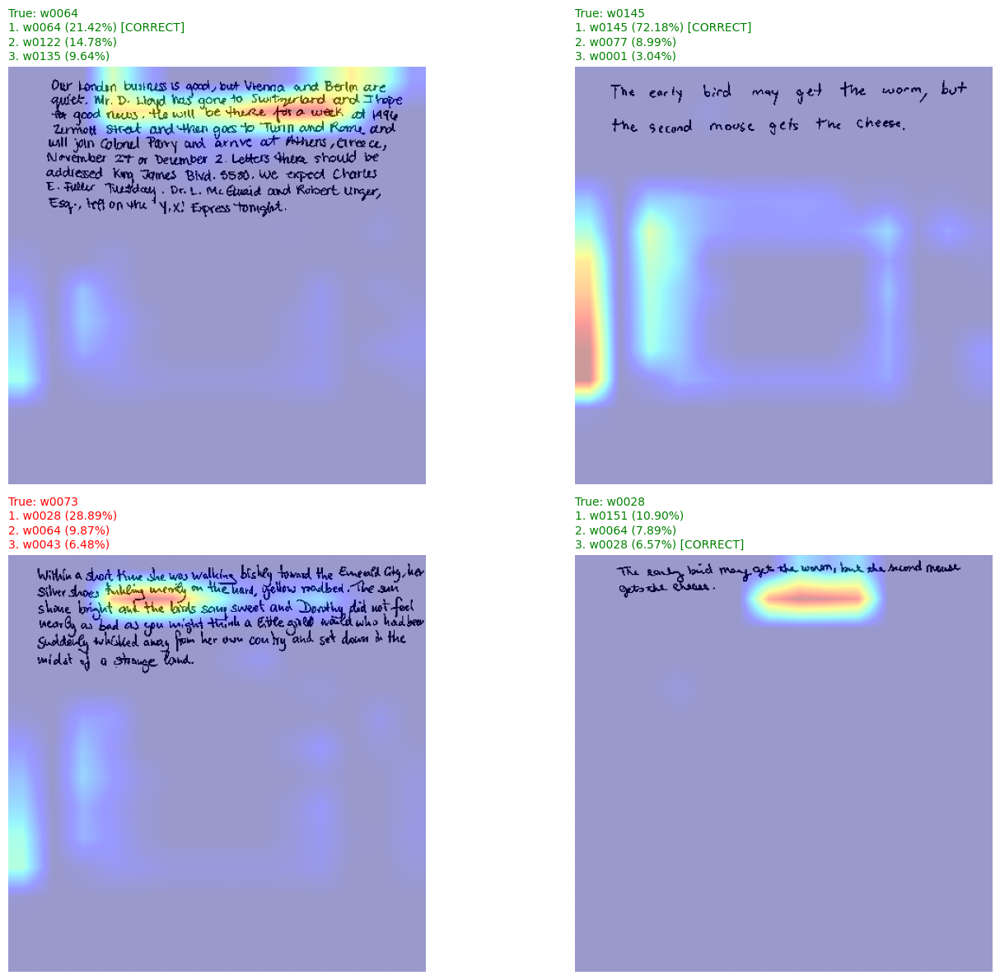

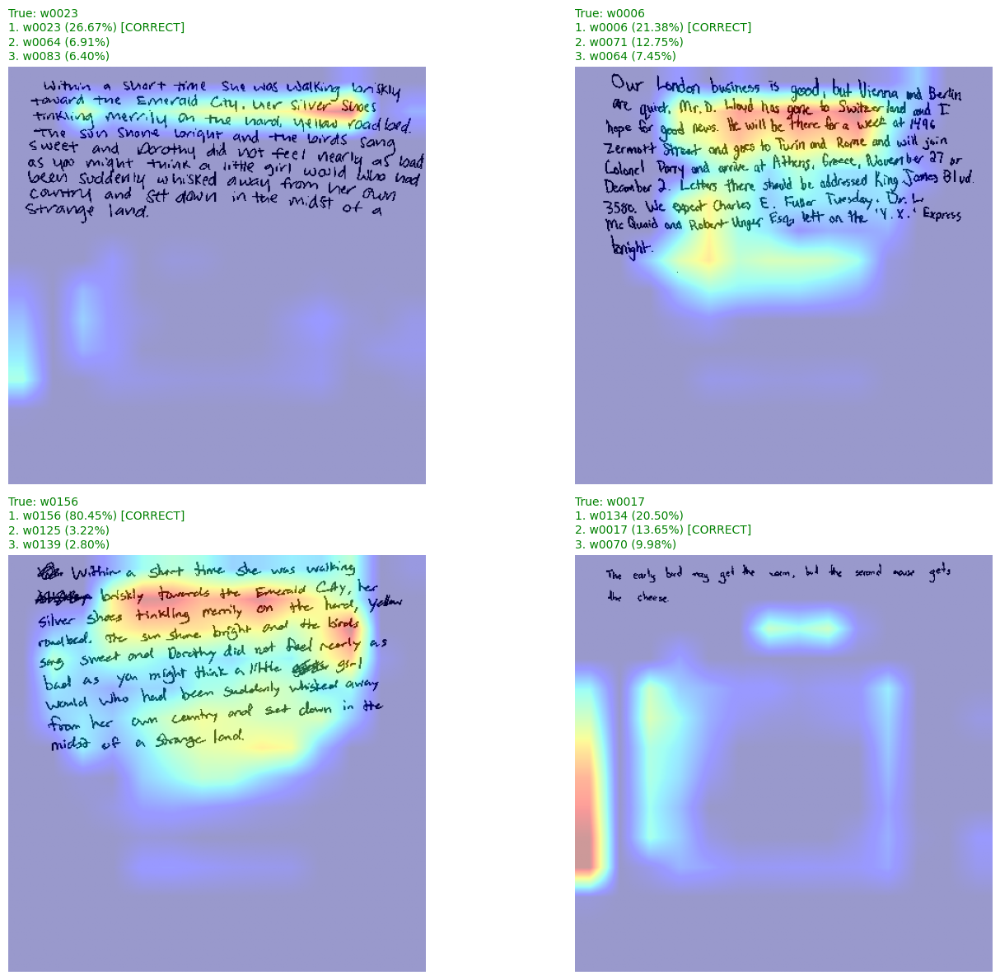

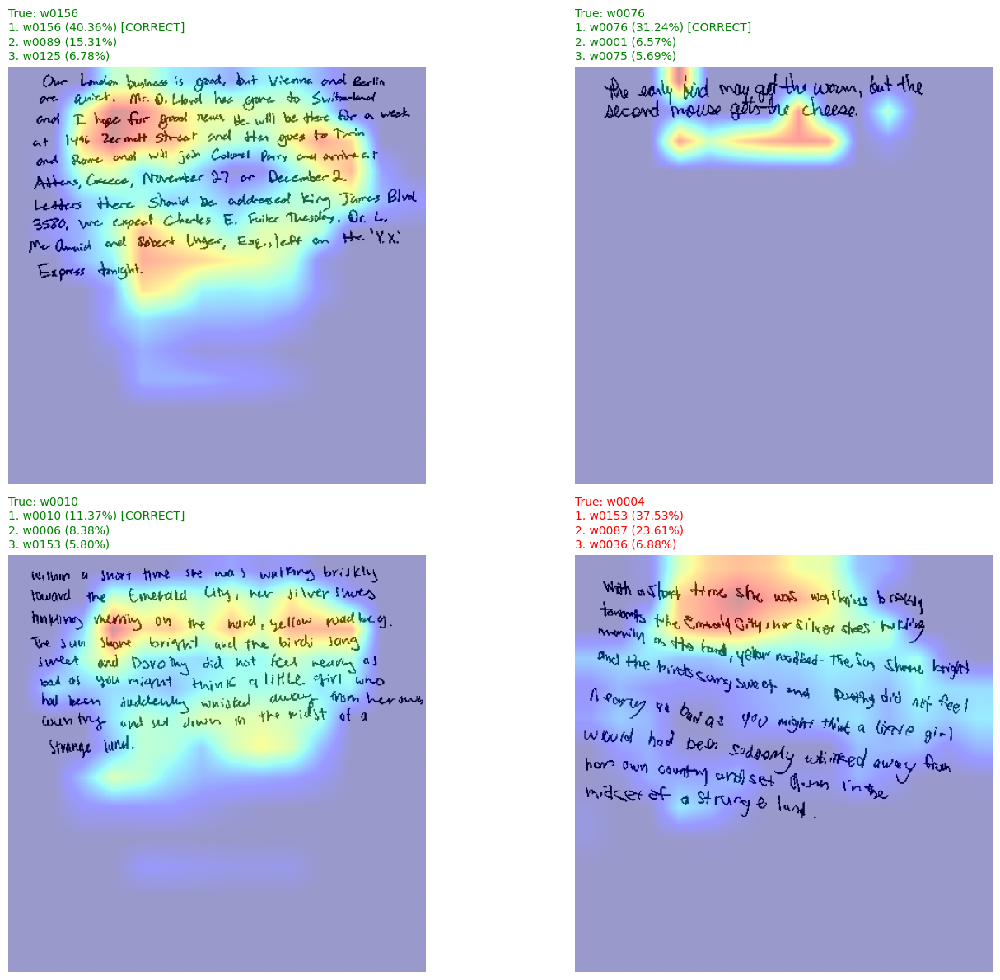

CPU times: user 6.9 s, sys: 312 ms, total: 7.21 s
Wall time: 6.6 s


In [ ]:
%%time
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="out_relu", n=4)
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="out_relu", n=4)
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="out_relu", n=4)

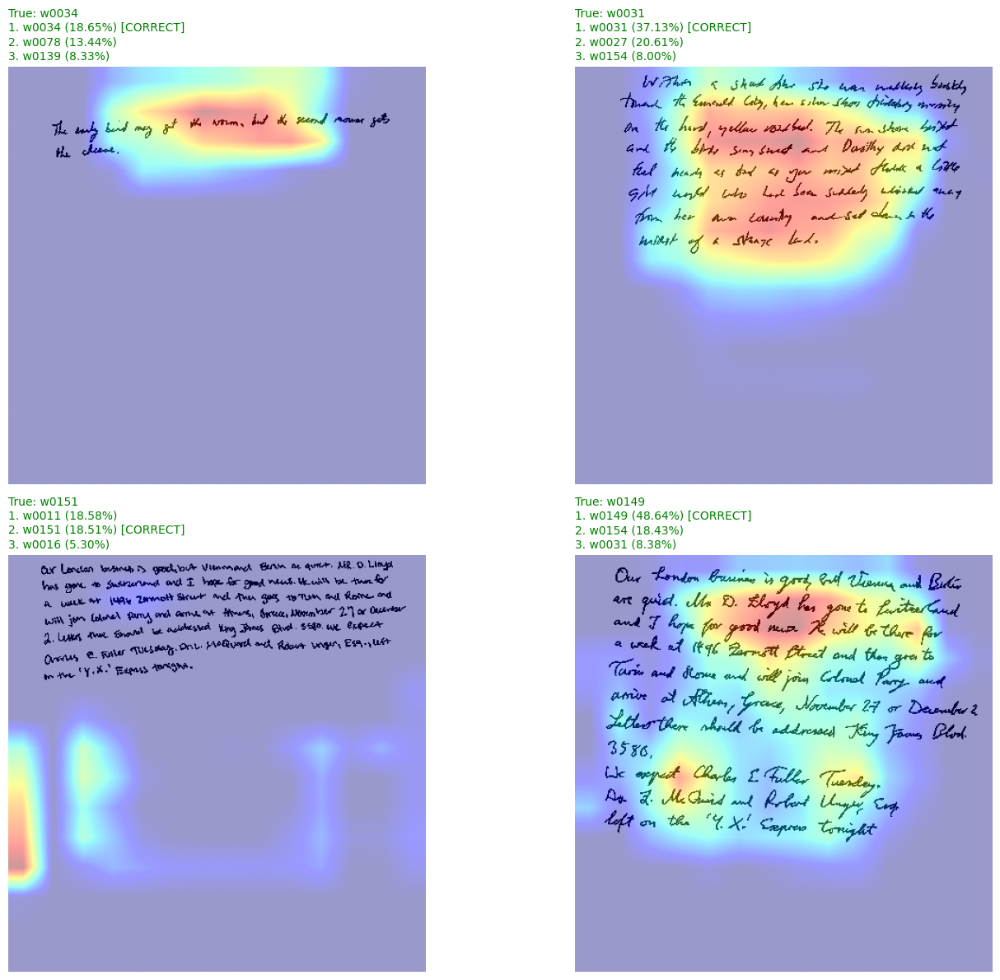

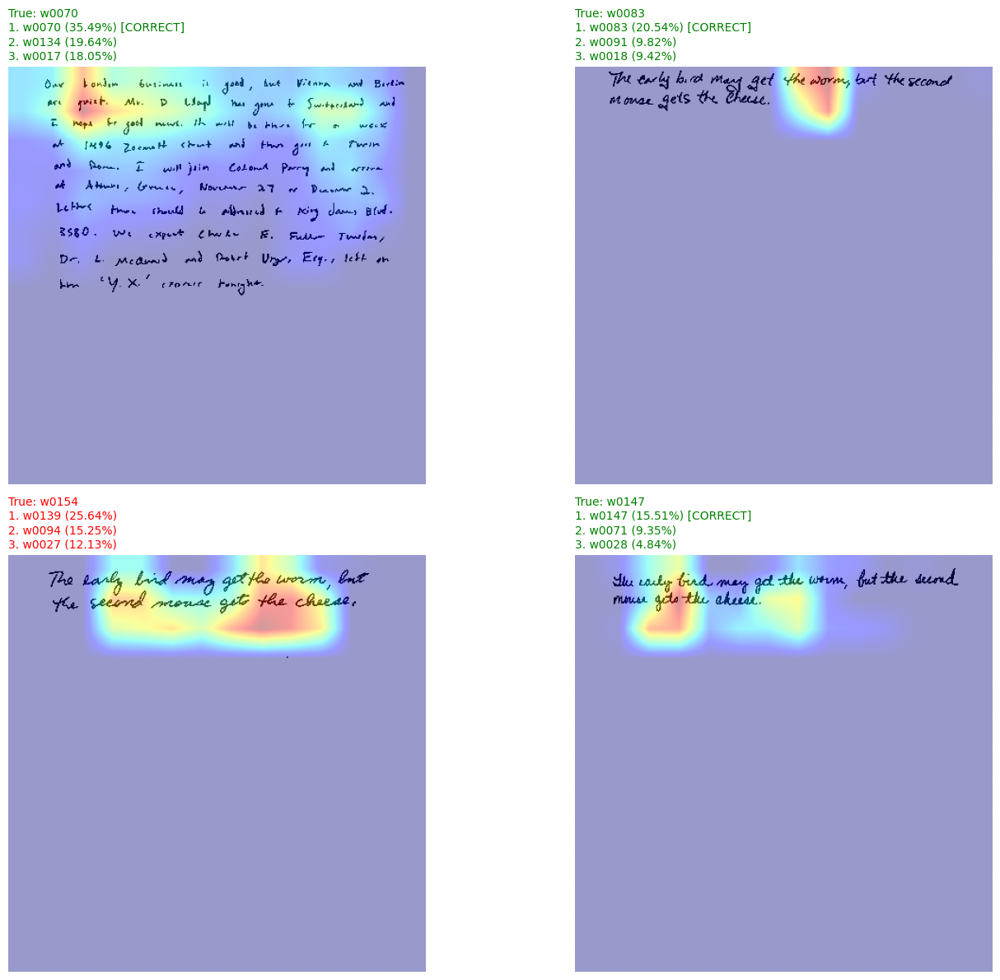

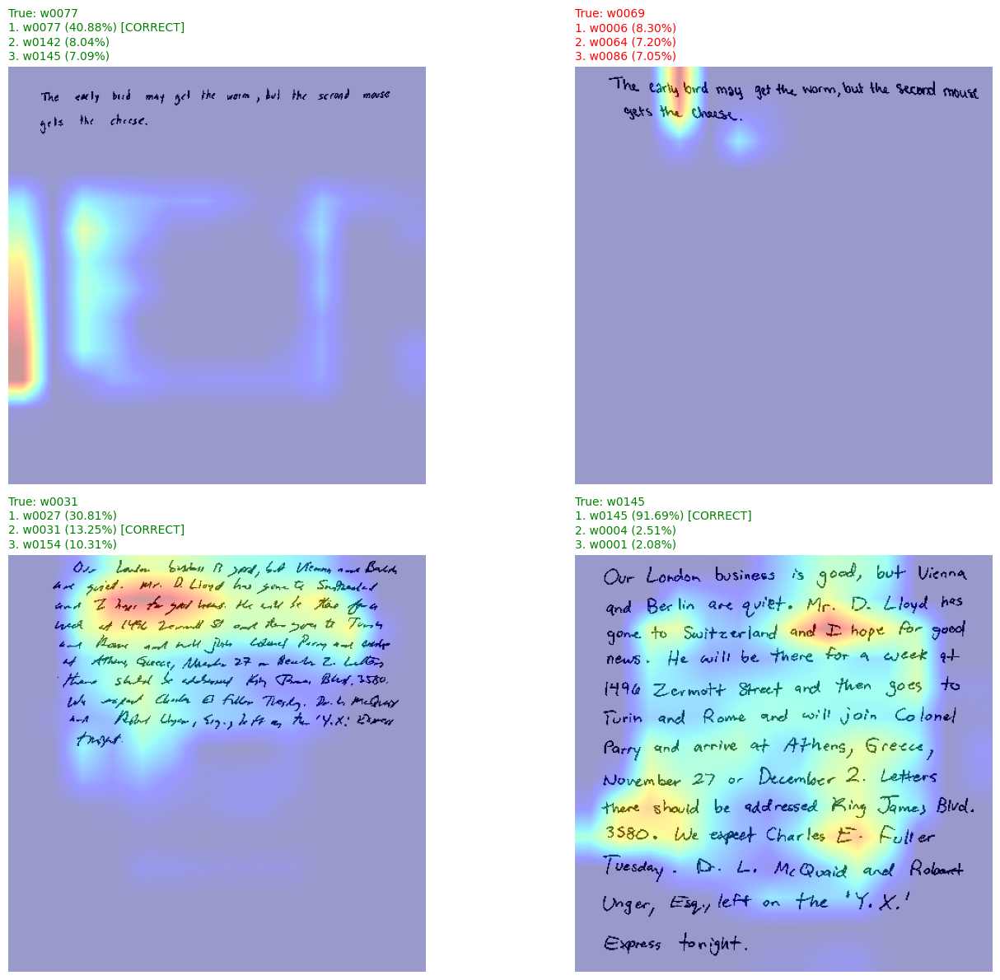

CPU times: user 6.93 s, sys: 261 ms, total: 7.19 s
Wall time: 6.57 s


In [ ]:
%%time
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="out_relu", n=4)
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="out_relu", n=4)
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="out_relu", n=4)

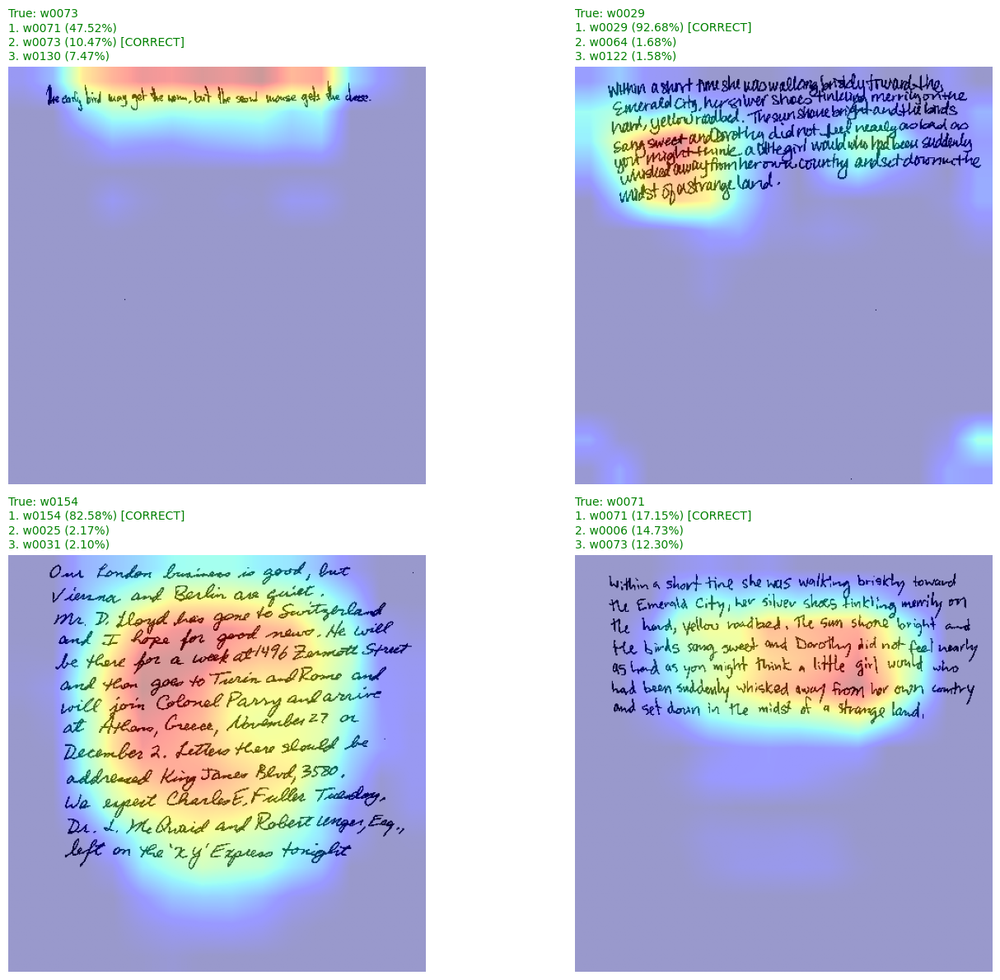

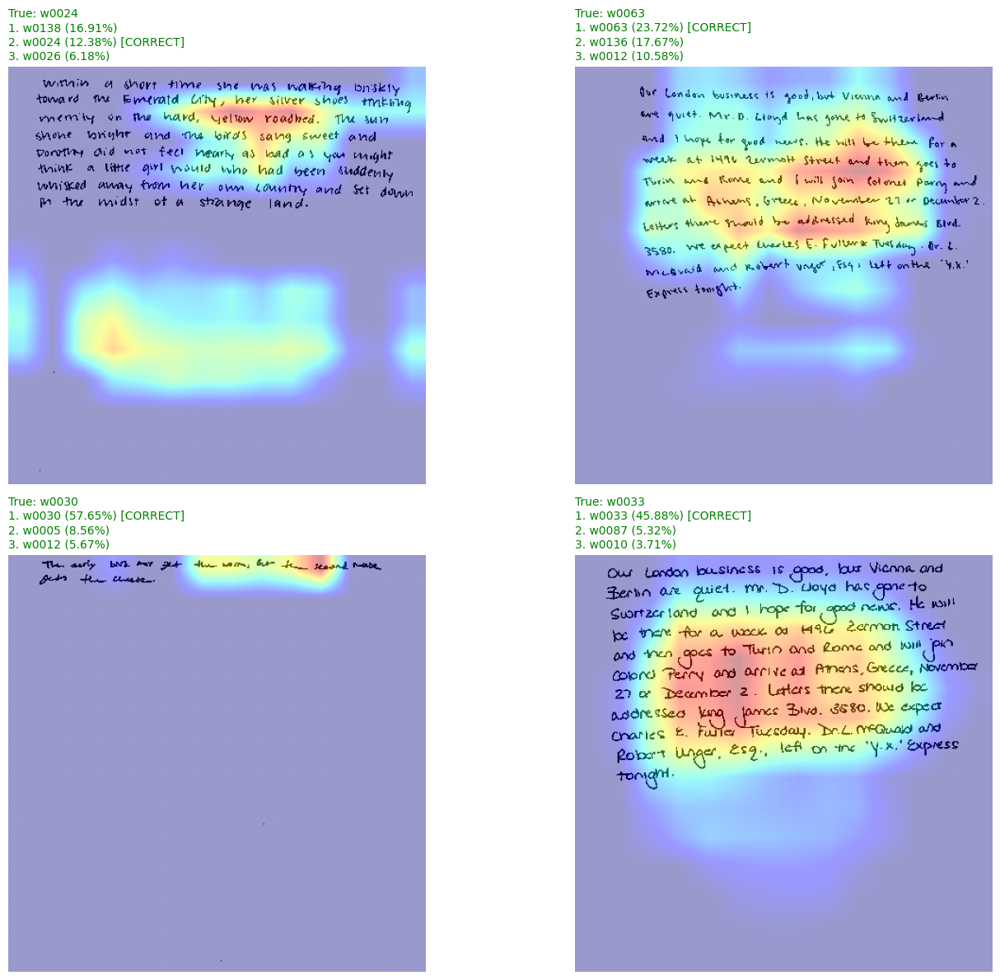

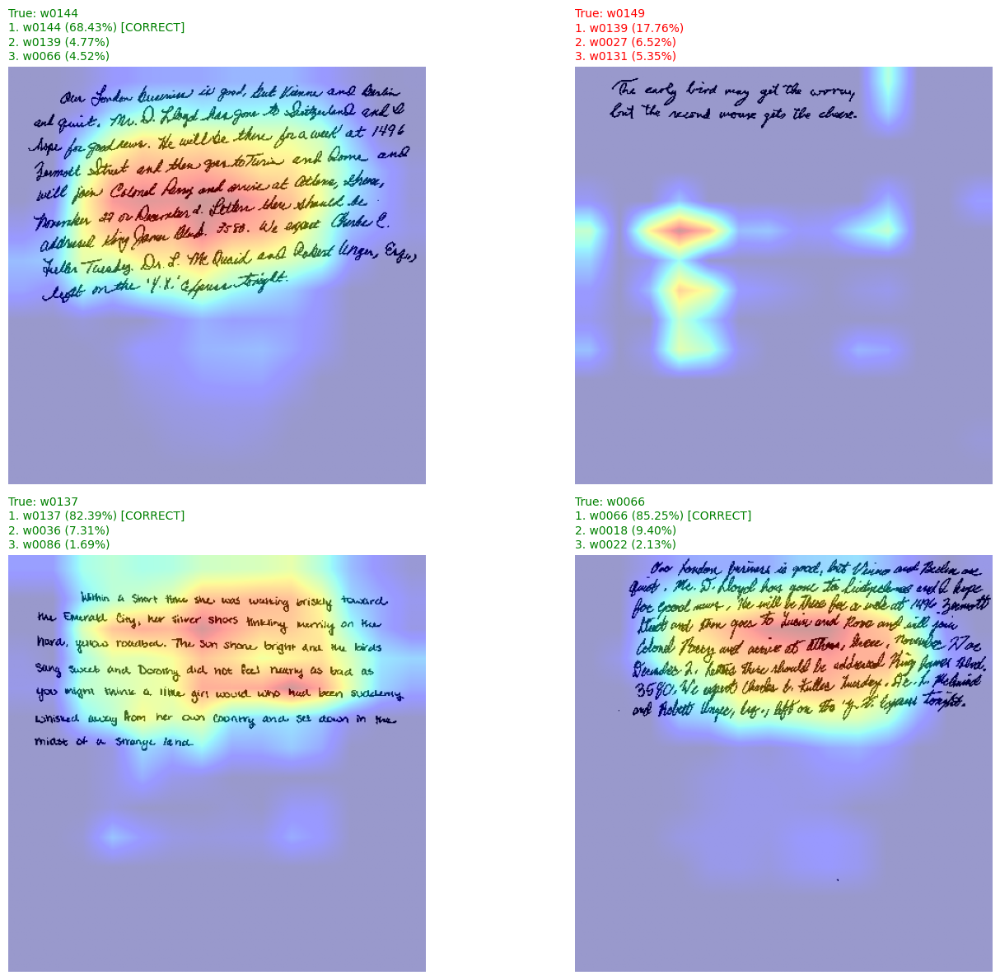

CPU times: user 6.91 s, sys: 270 ms, total: 7.18 s
Wall time: 6.65 s


In [ ]:
%%time
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="Conv_1", n=4)
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="Conv_1", n=4)
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="Conv_1", n=4)

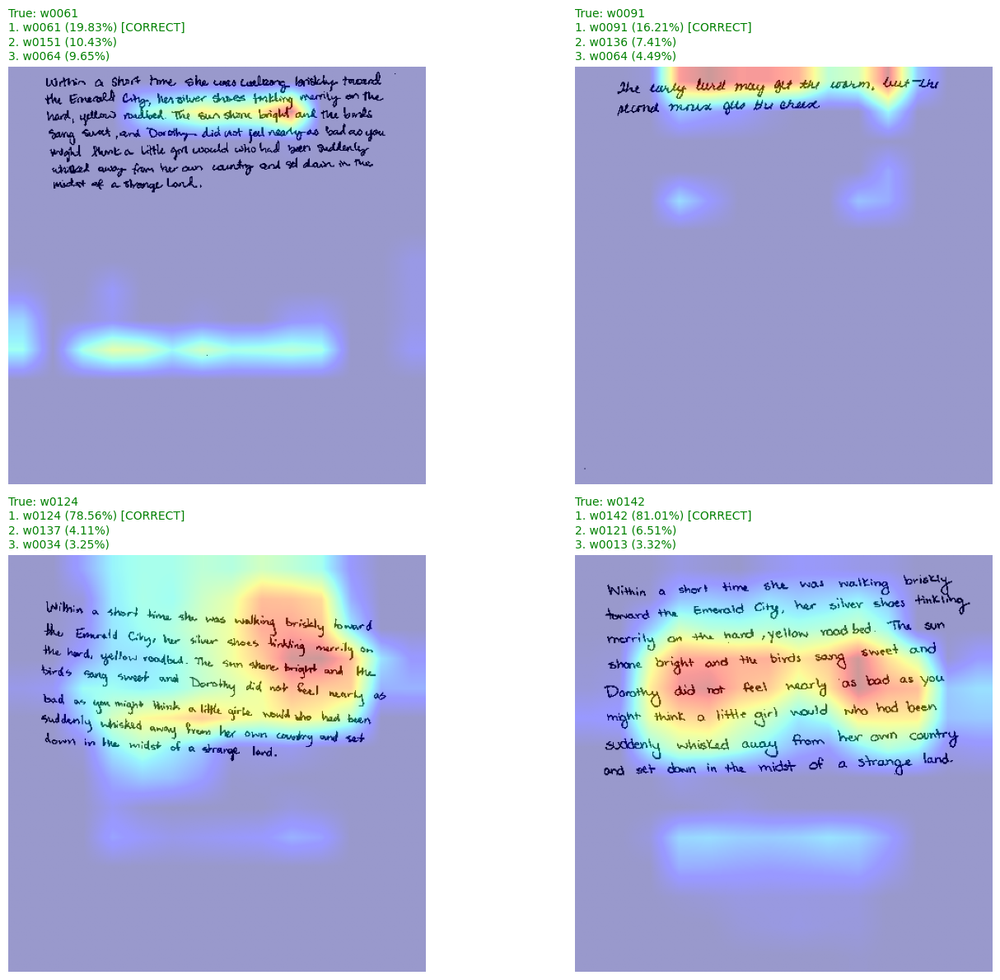

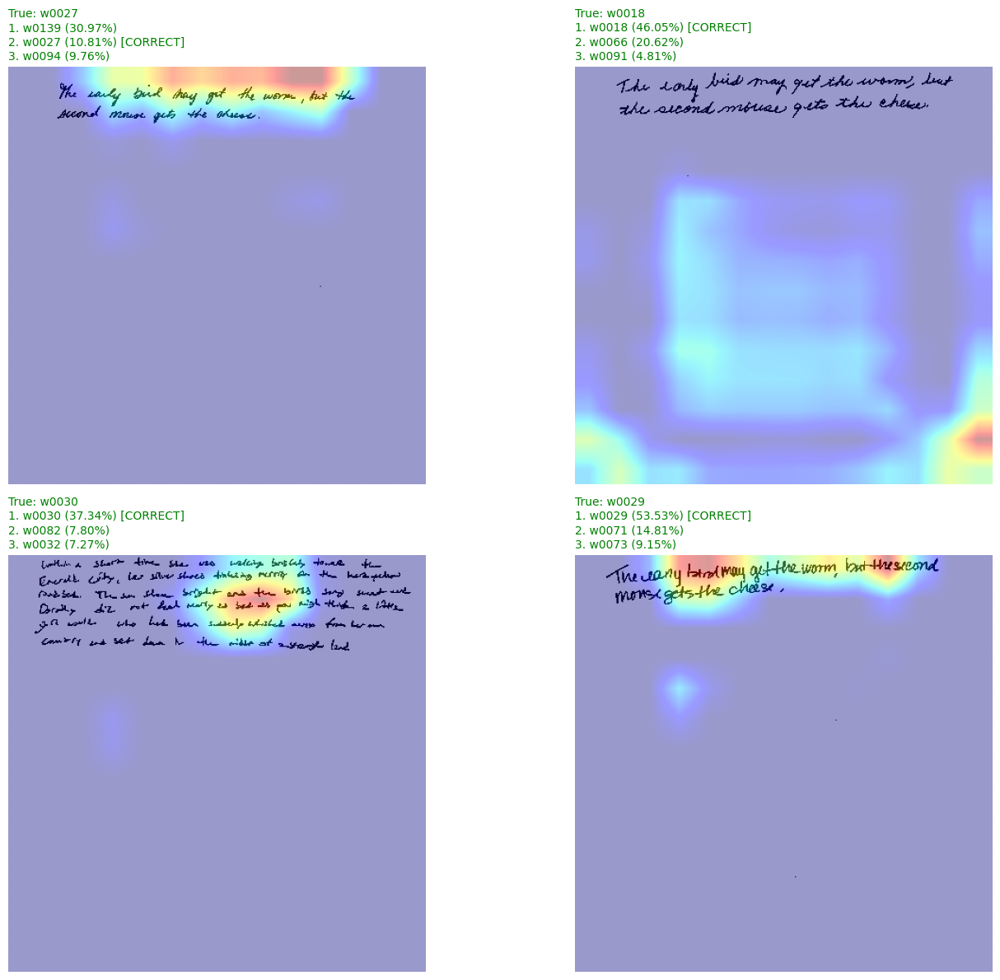

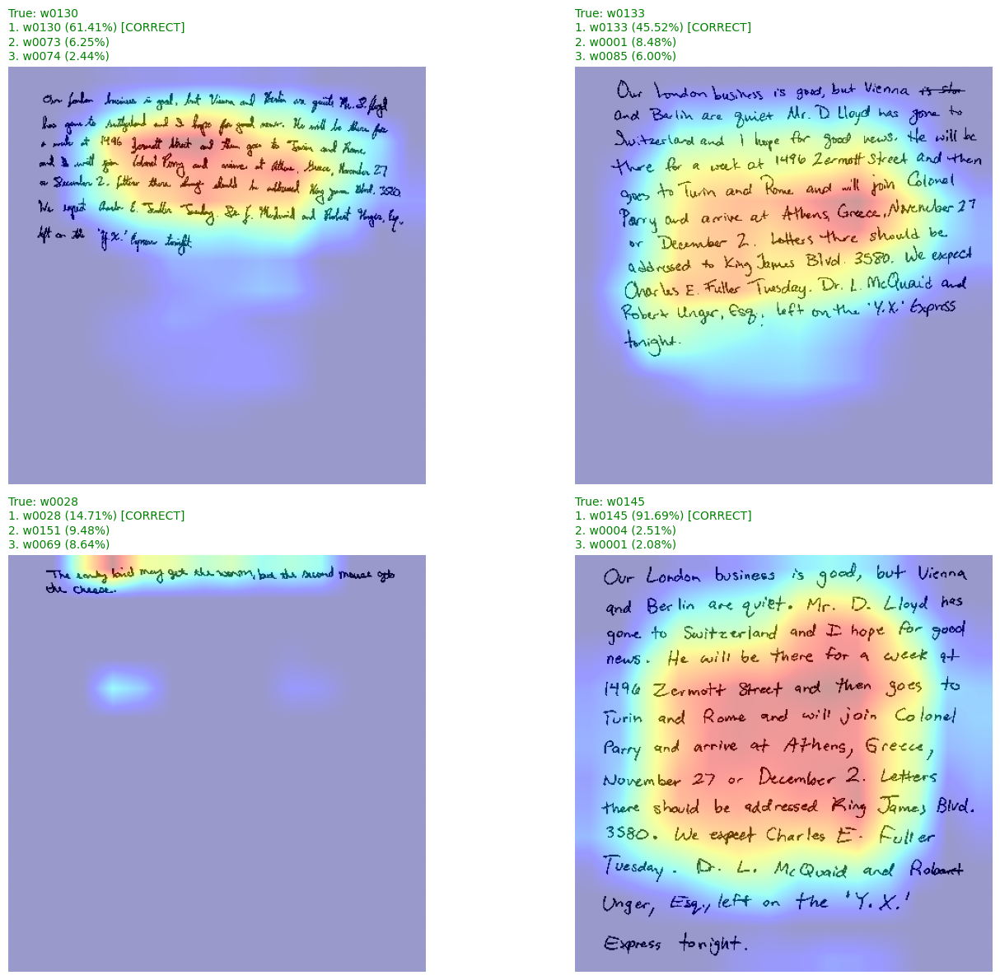

CPU times: user 6.81 s, sys: 300 ms, total: 7.11 s
Wall time: 6.57 s


In [ ]:
%%time
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="Conv_1", n=4)
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="Conv_1", n=4)
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="Conv_1", n=4)

# Stratified K-Fold CV (abandoned)

In [ ]:
import numpy as np
import tensorflow as tf
from sklearn.model_selection import StratifiedKFold
import pathlib

# 1. Setup your paths
data_dir = pathlib.Path(new_data_dir)
# Get all file paths and their parent folder names (labels)
all_paths = np.array(list(data_dir.glob('*/*.png')))
all_labels = np.array([p.parent.name for p in all_paths])

# 2. Define your CV parameters
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
fold_no = 1

for train_index, val_index in kf.split(all_paths, all_labels):
    print(f'--- Training Fold {fold_no} ---')

    # Get paths for this specific fold
    train_paths = all_paths[train_index].astype(str)
    val_paths = all_paths[val_index].astype(str)

    # 3. Create datasets using a helper or standard loading
    # You can adapt your existing preprocessing here
    train_ds = tf.data.Dataset.from_tensor_slices((train_paths, all_labels[train_index]))
    val_ds = tf.data.Dataset.from_tensor_slices((val_paths, all_labels[val_index]))

    # (Add your .map(preprocess).batch(batch_size) logic here)

    # 4. Re-initialize and Compile Model
    # IMPORTANT: You must re-create the model inside the loop
    model = create_my_cnn_model()
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    # 5. Train
    history = model.fit(train_ds, validation_data=val_ds, epochs=15)

    fold_no += 1

In [ ]:
! unzip -q /content/AllClass_bw_test.zip

In [ ]:
model=load_model("AllClass5_bw.keras")

In [ ]:
model.summary()

Model: "mobilenet_allclass5_bw"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 12, 12, 1280)   │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 12, 12, 1280)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 475)            │       608,475 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,083,411 (15.58 MB)

 Trainable params: 608,475 (2.32 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 1,216,952 (4.64 MB)

In [ ]:
model.save_weights("AllClass5_weights.weights.h5")

In [ ]:
print(reload_data2.w_ids475)

['w0001', 'w0002', 'w0003', 'w0004', 'w0005', 'w0006', 'w0009', 'w0010', 'w0011', 'w0012', 'w0013', 'w0015', 'w0016', 'w0017', 'w0018', 'w0020', 'w0022', 'w0023', 'w0024', 'w0025', 'w0026', 'w0027', 'w0028', 'w0029', 'w0030', 'w0031', 'w0032', 'w0033', 'w0034', 'w0035', 'w0036', 'w0038', 'w0040', 'w0041', 'w0042', 'w0043', 'w0049', 'w0058', 'w0061', 'w0062', 'w0063', 'w0064', 'w0066', 'w0069', 'w0070', 'w0071', 'w0073', 'w0074', 'w0075', 'w0076', 'w0077', 'w0078', 'w0080', 'w0082', 'w0083', 'w0085', 'w0086', 'w0087', 'w0088', 'w0089', 'w0090', 'w0091', 'w0092', 'w0093', 'w0094', 'w0095', 'w0099', 'w0102', 'w0118', 'w0119', 'w0121', 'w0122', 'w0123', 'w0124', 'w0125', 'w0126', 'w0128', 'w0129', 'w0130', 'w0131', 'w0132', 'w0133', 'w0134', 'w0135', 'w0136', 'w0137', 'w0138', 'w0139', 'w0142', 'w0143', 'w0144', 'w0145', 'w0146', 'w0147', 'w0148', 'w0149', 'w0150', 'w0151', 'w0152', 'w0153', 'w0154', 'w0155', 'w0156', 'w0157', 'w0160', 'w0162', 'w0175', 'w0177', 'w0180', 'w0182', 'w0184', 

In [ ]:
len(['w0001', 'w0002', 'w0003', 'w0004', 'w0005', 'w0006', 'w0009', 'w0010', 'w0011', 'w0012', 'w0013', 'w0015', 'w0016', 'w0017', 'w0018', 'w0020', 'w0022', 'w0023', 'w0024', 'w0025', 'w0026', 'w0027', 'w0028', 'w0029', 'w0030', 'w0031', 'w0032', 'w0033', 'w0034', 'w0035', 'w0036', 'w0038', 'w0040', 'w0041', 'w0042', 'w0043', 'w0049', 'w0058', 'w0061', 'w0062', 'w0063', 'w0064', 'w0066', 'w0069', 'w0070', 'w0071', 'w0073', 'w0074', 'w0075', 'w0076', 'w0077', 'w0078', 'w0080', 'w0082', 'w0083', 'w0085', 'w0086', 'w0087', 'w0088', 'w0089', 'w0090', 'w0091', 'w0092', 'w0093', 'w0094', 'w0095', 'w0099', 'w0102', 'w0118', 'w0119', 'w0121', 'w0122', 'w0123', 'w0124', 'w0125', 'w0126', 'w0128', 'w0129', 'w0130', 'w0131', 'w0132', 'w0133', 'w0134', 'w0135', 'w0136', 'w0137', 'w0138', 'w0139', 'w0142', 'w0143', 'w0144', 'w0145', 'w0146', 'w0147', 'w0148', 'w0149', 'w0150', 'w0151', 'w0152', 'w0153', 'w0154', 'w0155', 'w0156', 'w0157', 'w0160', 'w0162', 'w0175', 'w0177', 'w0180', 'w0182', 'w0184', 'w0186', 'w0189', 'w0191', 'w0193', 'w0198', 'w0199', 'w0200', 'w0201', 'w0202', 'w0203', 'w0204', 'w0205', 'w0206', 'w0212', 'w0218', 'w0220', 'w0223', 'w0224', 'w0226', 'w0227', 'w0229', 'w0232', 'w0233', 'w0234', 'w0238', 'w0239', 'w0240', 'w0242', 'w0244', 'w0245', 'w0246', 'w0249', 'w0254', 'w0255', 'w0260', 'w0261', 'w0262', 'w0263', 'w0264', 'w0270', 'w0271', 'w0276', 'w0277', 'w0279', 'w0280', 'w0281', 'w0282', 'w0284', 'w0285', 'w0286', 'w0287', 'w0288', 'w0291', 'w0293', 'w0297', 'w0299', 'w0301', 'w0302', 'w0304', 'w0305', 'w0306', 'w0308', 'w0312', 'w0313', 'w0314', 'w0315', 'w0317', 'w0319', 'w0320', 'w0322', 'w0330', 'w0333', 'w0334', 'w0335', 'w0337', 'w0338', 'w0339', 'w0340', 'w0341', 'w0342', 'w0344', 'w0348', 'w0350', 'w0351', 'w0352', 'w0353', 'w0354', 'w0355', 'w0356', 'w0357', 'w0359', 'w0362', 'w0364', 'w0365', 'w0367', 'w0368', 'w0370', 'w0371', 'w0372', 'w0375', 'w0379', 'w0380', 'w0381', 'w0382', 'w0383', 'w0384', 'w0387', 'w0388', 'w0391', 'w0392', 'w0393', 'w0396', 'w0397', 'w0398', 'w0399', 'w0400', 'w0401', 'w0402', 'w0403', 'w0405', 'w0406', 'w0407', 'w0408', 'w0409', 'w0410', 'w0411', 'w0412', 'w0413', 'w0414', 'w0415', 'w0416', 'w0417', 'w0419', 'w0420', 'w0422', 'w0424', 'w0425', 'w0426', 'w0428', 'w0429', 'w0431', 'w0433', 'w0435', 'w0436', 'w0439', 'w0440', 'w0441', 'w0443', 'w0444', 'w0445', 'w0446', 'w0448', 'w0450', 'w0451', 'w0452', 'w0454', 'w0456', 'w0458', 'w0460', 'w0462', 'w0463', 'w0464', 'w0465', 'w0466', 'w0467', 'w0468', 'w0469', 'w0470', 'w0471', 'w0472', 'w0473', 'w0474', 'w0475', 'w0476', 'w0477', 'w0479', 'w0480', 'w0481', 'w0483', 'w0484', 'w0485', 'w0486', 'w0487', 'w0489', 'w0492', 'w0493', 'w0495', 'w0497', 'w0498', 'w0500', 'w0501', 'w0502', 'w0508', 'w0510', 'w0513', 'w0514', 'w0515', 'w0516', 'w0517', 'w0518', 'w0519', 'w0520', 'w0521', 'w0522', 'w0523', 'w0524', 'w0525', 'w0526', 'w0527', 'w0528', 'w0529', 'w0530', 'w0531', 'w0532', 'w0533', 'w0534', 'w0535', 'w0536', 'w0537', 'w0538', 'w0541', 'w0542', 'w0543', 'w0546', 'w0547', 'w0548', 'w0549', 'w0550', 'w0551', 'w0552', 'w0553', 'w0554', 'w0555', 'w0557', 'w0559', 'w0560', 'w0561', 'w0562', 'w0564', 'w0565', 'w0566', 'w0569', 'w0570', 'w0571', 'w0572', 'w0573', 'w0575', 'w0576', 'w0577', 'w0579', 'w0580', 'w0581', 'w0586', 'w0587', 'w0588', 'w0589', 'w0590', 'w0591', 'w0592', 'w0593', 'w0594', 'w0595', 'w0596', 'w0597', 'w0598', 'w0599', 'w0600', 'w0601', 'w0602', 'w0604', 'w0605', 'w0606', 'w0611', 'w0612', 'w0613', 'w0615', 'w0617', 'w0618', 'w0619', 'w0620', 'w0621', 'w0622', 'w0623', 'w0624', 'w0626', 'w0627', 'w0628', 'w0629', 'w0630', 'w0632', 'w0634', 'w0636', 'w0637', 'w0638', 'w0639', 'w0640', 'w0641', 'w0642', 'w0644', 'w0645', 'w0646', 'w0647', 'w0648', 'w0650', 'w0653', 'w0656', 'w0657', 'w0658', 'w0660', 'w0661', 'w0662', 'w0664', 'w0665', 'w0666', 'w0667', 'w0668', 'w0669', 'w0671', 'w0673', 'w0674', 'w0675', 'w0677', 'w0678', 'w0679', 'w0680', 'w0682', 'w0683', 'w0685', 'w0688', 'w0691', 'w0692', 'w0693', 'w0694', 'w0695', 'w0698', 'w0699', 'w0700', 'w0701', 'w0702', 'w0703', 'w0704', 'w0705', 'w0706', 'w0707', 'w0709', 'w0710', 'w0711', 'w0712', 'w0713', 'w0714', 'w0715', 'w0717', 'w0719', 'w0720', 'w0418', 'w0453', 'w0394', 'w0345', 'w0478', 'w0670', 'w0289', 'w0459', 'w0216', 'w0378']

)

475